# 1. Data

In [1]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

## 1.1. Загрузим данные по пользователям

In [ ]:
users = pd.read_csv('users.csv', names=['user_num', 'link', 'user_name', 'reputation_sum'], header=None)
users

,user_num,link,user_name,reputation_sum
0,1,https://scifi.stackexchange.com/users/20774/va...,valorum,695009
1,2,https://scifi.stackexchange.com/users/976/dvk-...,dvk-on-ahch-to,342931
2,3,https://scifi.stackexchange.com/users/23243/fu...,fuzzyboots,227699
3,4,https://scifi.stackexchange.com/users/2765/tha...,thaddeus-howze,212888
4,5,https://scifi.stackexchange.com/users/3500/sly...,slytherincess,164934
...,...,...,...,...
5395,5396,https://scifi.stackexchange.com/users/487/tanath,tanath,371
5396,5397,https://scifi.stackexchange.com/users/33090/ma...,makyen,370
5397,5398,https://scifi.stackexchange.com/users/26532/an...,andrew-martin,370
5398,5399,https://scifi.stackexchange.com/users/25938/ro...,roman-a-taycher,370


In [ ]:
user_tags = pd.read_csv('user_tags.csv', names=['user_num', 'link', 'user_name', 'tag', 'reputation', 'num_answers'], header=None)
user_tags

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-wars,25206,1638
1,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-trek,20366,1460
2,1,https://scifi.stackexchange.com/users/20774/va...,valorum,harry-potter,13788,742
3,1,https://scifi.stackexchange.com/users/20774/va...,valorum,story-identification,12722,1216
4,1,https://scifi.stackexchange.com/users/20774/va...,valorum,star-trek-tng,8255,515
...,...,...,...,...,...,...
18326,100,https://scifi.stackexchange.com/users/20490/go...,gowenfawr,divergent,3,1
18327,100,https://scifi.stackexchange.com/users/20490/go...,gowenfawr,star-trek-tos,3,1
18328,100,https://scifi.stackexchange.com/users/20490/go...,gowenfawr,star-trek-ds9,3,1
18329,100,https://scifi.stackexchange.com/users/20490/go...,gowenfawr,star-trek-tng,3,1


In [ ]:
all_tags = pd.DataFrame(user_tags['tag'].value_counts())
all_tags = all_tags[all_tags['count'] >= 20]
all_tags

,count
tag,
movie,93
star-wars,92
story-identification,92
harry-potter,84
marvel,82
...,...
gravity,20
the-martian,20
batman-v-superman-dawn-of-justice,20


## 1.2. Загрузим данные по вопросам

In [56]:
question_list = pd.read_csv("question_list.csv", header=None)[0].tolist()
len(question_list)

33803

In [57]:
answer_data = pd.read_csv("answers_res.csv", names=['user_num', 'link', 'num_answer', 'tags', 'is_question', 'answer_text', 'author_name', 'reputation', 'likes'], header=None)
answer_data

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
1,1,https://scifi.stackexchange.com/questions/6887...,1,"['dc', 'superman', 'character-identification',...",False,This is Nam-Ek\n\nNam-Ek was born on the dista...,EricSSH,"1,383",13
2,1,https://scifi.stackexchange.com/questions/6887...,2,"['dc', 'superman', 'character-identification',...",False,"This could also be Tor-An, a large Kryptonian ...",Omegacron,63.3k,4
3,1,https://scifi.stackexchange.com/questions/6887...,3,"['dc', 'superman', 'character-identification',...",False,That was Sciencist NON....the mentor /ex-frien...,CHRISTOPHER A. DAVIS DAVIS,1,-1
4,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
...,...,...,...,...,...,...,...,...,...
20983,5999,https://scifi.stackexchange.com/questions/8642...,1,"['story-identification', 'episode-identificati...",False,Thanks to a comment by @Hypnosifl I have disco...,Frank Zafka,245,4
20984,5999,https://scifi.stackexchange.com/questions/8642...,2,"['story-identification', 'episode-identificati...",False,"Assuming that the timeframe is correct, and th...",Omegacron,63.3k,2
20985,5999,https://scifi.stackexchange.com/questions/8642...,3,"['story-identification', 'episode-identificati...",False,It was possibly don’t be afraid of the dark th...,Dylan,1,-1
20986,6000,https://scifi.stackexchange.com/questions/1983...,0,['story-identification'],True,"I read a story a while ago about humans, as a ...",Story searcher 38373635343,221,22


In [58]:
substring = "<a href"
answer_data['problem'] = answer_data['tags'].apply(lambda x: 1 if substring in x else 0)

In [59]:
answer_data_clean = answer_data[answer_data['problem'] == 0]
answer_data_clean = answer_data_clean.drop(['problem'], axis=1)
answer_data_clean = answer_data_clean.reset_index(drop=True)
answer_data_clean

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
1,1,https://scifi.stackexchange.com/questions/6887...,1,"['dc', 'superman', 'character-identification',...",False,This is Nam-Ek\n\nNam-Ek was born on the dista...,EricSSH,"1,383",13
2,1,https://scifi.stackexchange.com/questions/6887...,2,"['dc', 'superman', 'character-identification',...",False,"This could also be Tor-An, a large Kryptonian ...",Omegacron,63.3k,4
3,1,https://scifi.stackexchange.com/questions/6887...,3,"['dc', 'superman', 'character-identification',...",False,That was Sciencist NON....the mentor /ex-frien...,CHRISTOPHER A. DAVIS DAVIS,1,-1
4,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
...,...,...,...,...,...,...,...,...,...
20847,5999,https://scifi.stackexchange.com/questions/8642...,1,"['story-identification', 'episode-identificati...",False,Thanks to a comment by @Hypnosifl I have disco...,Frank Zafka,245,4
20848,5999,https://scifi.stackexchange.com/questions/8642...,2,"['story-identification', 'episode-identificati...",False,"Assuming that the timeframe is correct, and th...",Omegacron,63.3k,2
20849,5999,https://scifi.stackexchange.com/questions/8642...,3,"['story-identification', 'episode-identificati...",False,It was possibly don’t be afraid of the dark th...,Dylan,1,-1
20850,6000,https://scifi.stackexchange.com/questions/1983...,0,['story-identification'],True,"I read a story a while ago about humans, as a ...",Story searcher 38373635343,221,22


In [60]:
questions = answer_data_clean[answer_data_clean['is_question'] == True]
questions

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://scifi.stackexchange.com/questions/6887...,0,"['dc', 'superman', 'character-identification',...",True,"In Man of Steel, when Zod attacks the Council,...",Kreann,"8,407",13
4,2,https://scifi.stackexchange.com/questions/1614...,0,['mummy-2017'],True,"In The Mummy 2017, the title character has sym...",CodeMed,10.8k,12
8,3,https://scifi.stackexchange.com/questions/2790...,0,"['story-identification', 'short-stories', 'ali...",True,I've been trying to find this story for years....,Ralph Johnson Jr.,163,16
10,4,https://scifi.stackexchange.com/questions/1211...,0,"['star-wars', 'clones']",True,With reference to Why did the Empire discontin...,thegreatjedi,34.2k,6
16,5,https://scifi.stackexchange.com/questions/1204...,0,"['aliens', 'history-of', 'terminology']",True,"It is fairly common nowadays, for example in S...",ThePopMachine,59.7k,2
...,...,...,...,...,...,...,...,...,...
20833,5996,https://scifi.stackexchange.com/questions/2656...,0,"['men-in-black', 'men-in-black-3']",True,A the end of the third installment of the Men ...,Jack B Nimble,115k,10
20837,5997,https://scifi.stackexchange.com/questions/6700...,0,"['star-trek', 'star-trek-tng', 'worf']",True,Worf was rescued from the wreckage of the Khit...,erdiede,"9,220",42
20843,5998,https://scifi.stackexchange.com/questions/2154...,0,"['marvel', 'marvel-cinematic-universe', 'spide...",True,"I saw Spider-Man: Far From Home yesterday, and...",TinyDoowy,"2,587",10
20846,5999,https://scifi.stackexchange.com/questions/8642...,0,"['story-identification', 'episode-identificati...",True,I am trying to track down the name of a film o...,Frank Zafka,245,4


# 2. Похожесть тэгов

In [61]:
_tags = []

tags = questions['tags']
tags

0        ['dc', 'superman', 'character-identification',...
4                                           ['mummy-2017']
8        ['story-identification', 'short-stories', 'ali...
10                                 ['star-wars', 'clones']
16                 ['aliens', 'history-of', 'terminology']
                               ...                        
20833                   ['men-in-black', 'men-in-black-3']
20837               ['star-trek', 'star-trek-tng', 'worf']
20843    ['marvel', 'marvel-cinematic-universe', 'spide...
20846    ['story-identification', 'episode-identificati...
20850                             ['story-identification']
Name: tags, Length: 5965, dtype: object

In [62]:
_tags = []
import re
for tag in tags:
    tag = tag.replace("'", '')
    tag = tag.replace('[', '')
    tag = tag.replace(']', '')
    tag = tag.replace(',', '')
    _tags.append(re.split(" ", tag))

In [63]:
list_tags = []
for tag in _tags:
  for t in tag:
    if t != '':  # убираем безтеговые вопросы
        list_tags.append(t)
len(list_tags)

13200

In [64]:
set_tags = set(list_tags)
len(set_tags)

1263

In [65]:
df_list_tags = pd.DataFrame(list_tags)
df_list_tags = df_list_tags[0].value_counts().head(1500)
#df_list_tags = df_list_tags[0].value_counts().head(10)
df_list_tags

0
story-identification     1287
harry-potter              837
star-wars                 644
star-trek                 472
marvel                    464
                         ... 
c-j-cherryh                 1
bane                        1
stop-motion-animation       1
dc-rebirth                  1
shape-shifter               1
Name: count, Length: 1263, dtype: int64

In [66]:
df_list_tags = pd.DataFrame(df_list_tags)
set_index_1 = df_list_tags.index
set_index_1

Index(['story-identification', 'harry-potter', 'star-wars', 'star-trek',
       'marvel', 'tolkiens-legendarium', 'short-stories',
       'marvel-cinematic-universe', 'dc', 'the-lord-of-the-rings',
       ...
       'pet-sematary', 'transformers-the-last-knight', 'winnie-the-pooh',
       'the-sandman', 'black-panther', 'c-j-cherryh', 'bane',
       'stop-motion-animation', 'dc-rebirth', 'shape-shifter'],
      dtype='object', name=0, length=1263)

In [67]:
set_tags = set(set_index_1)
len(set_tags)

1263

In [68]:
set_tags = pd.DataFrame(set_tags)
tags_dependence = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_dependence

,sauron,space-opera,vernor-vinge,ravenclaw,wax-wayne-novels,astronauts,universal-translator,thomas-covenant,dragon-ball,dragon-ball-z,...,immortals,wizards,ms-marvel,sergei-lukyanenko,starfleet-command,looper,the-animatrix,planet-of-the-apes,snowpiercer,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
space-opera,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ravenclaw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wax-wayne-novels,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
looper,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-animatrix,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
planet-of-the-apes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [69]:
set_tags = set(set_index_1)
for tag in _tags:
    if (len(tag) == 1 and (tag[0] in set_tags)):
        k = 0
        #tags_dependence[tag[0]][tag[0]] += 1
    elif (len(tag) >= 2):
        for idx, a in enumerate(tag):
            for b in tag[idx + 1:]:
                if ((a in set_tags) and (b in set_tags)):
                    a = str(a)
                    b = str(b)
                    tags_dependence[a][b] += 1
                    tags_dependence[b][a] += 1

tags_dependence

,sauron,space-opera,vernor-vinge,ravenclaw,wax-wayne-novels,astronauts,universal-translator,thomas-covenant,dragon-ball,dragon-ball-z,...,immortals,wizards,ms-marvel,sergei-lukyanenko,starfleet-command,looper,the-animatrix,planet-of-the-apes,snowpiercer,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
space-opera,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ravenclaw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wax-wayne-novels,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
looper,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-animatrix,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
planet-of-the-apes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [70]:
import networkx as nx
G = nx.from_numpy_array(tags_dependence.values)
mapping = dict(enumerate(tags_dependence.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 1263 nodes and 3998 edges


посчитаем Jaccard Similarity

In [71]:
def jaccard(tag1, tag2):
    union = [quest_tag for quest_tag in _tags if (tag1 in quest_tag or tag2 in quest_tag)]
    intersection = [quest_tag for quest_tag in _tags if (tag1 in quest_tag and tag2 in quest_tag)]

    return float(len(intersection) / len(union))

In [72]:
set_tags = pd.DataFrame(set_tags)
tags_jaccard = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_jaccard

,sauron,space-opera,vernor-vinge,ravenclaw,wax-wayne-novels,astronauts,universal-translator,thomas-covenant,dragon-ball,dragon-ball-z,...,immortals,wizards,ms-marvel,sergei-lukyanenko,starfleet-command,looper,the-animatrix,planet-of-the-apes,snowpiercer,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
space-opera,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ravenclaw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wax-wayne-novels,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
looper,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-animatrix,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
planet-of-the-apes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [73]:
list_numbers = [0]
list_tags = []

counter_zeroes = 0
counter_non_zeroes = 0
counter_big_values = 0

for i in range (len(set_index_1)):
    tag1 = set_index_1[i]
    for j in range (i + 1, len(set_index_1)):
        tag2 = set_index_1[j]
        _jaccard = jaccard(tag1, tag2)
        if (_jaccard != 0):
            list_numbers.append(_jaccard)
            counter_non_zeroes += 1
            if (_jaccard >= 0.05):
                tags_jaccard[tag1][tag2] = 1
                tags_jaccard[tag1][tag2] = 1
                list_tags.append(tag1)
                list_tags.append(tag2)
                counter_big_values += 1

        else:
            counter_zeroes += 1

In [74]:
print(counter_zeroes, counter_non_zeroes, counter_big_values)

792955 3998 1133


In [75]:
set_list_tags = set(list_tags)
len(set_list_tags)

911

In [76]:
np.percentile(list_numbers, 80)

0.07142857142857142

In [77]:
col_and_row = list(set_list_tags)
tags_jaccard = tags_jaccard.loc[col_and_row]
tags_jaccard = tags_jaccard[col_and_row]
tags_jaccard

,sauron,title-explanation,vernor-vinge,phaser,john-carpenter,music-video,dracula,larry-niven,h.g.wells,wax-wayne-novels,...,starfleet-command,revenge-of-the-sith,the-animatrix,kobayashi-maru,sergei-lukyanenko,doctor-dolittle,chronology,powers,numenor,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
title-explanation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
phaser,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
john-carpenter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
doctor-dolittle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
chronology,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
powers,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [78]:
import networkx as nx
G = nx.from_numpy_array(tags_jaccard.values)
mapping = dict(enumerate(tags_jaccard.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 911 nodes and 1133 edges


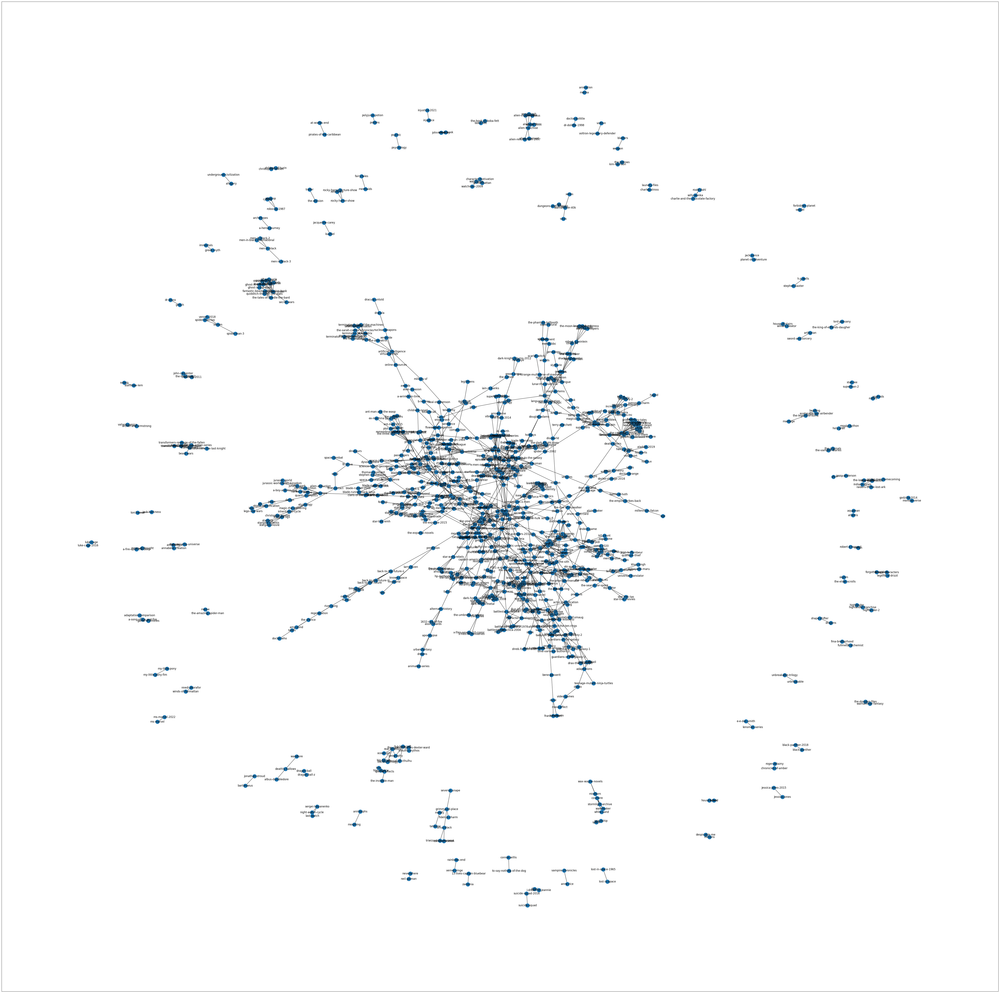

In [79]:
import matplotlib.pyplot as plt

plt.figure(figsize=(80, 80))
nx.draw_networkx(G)

In [80]:
list_num = [item for item in list_numbers if item > 0.05]
len(list_num)

1086

In [81]:
perc_0, perc_20, perc_40, perc_60, perc_80 = np.percentile (list_num, [0, 20, 40, 60, 80])
print(perc_0, perc_20, perc_40, perc_60, perc_80)

0.050156739811912224 0.06666666666666667 0.08823529411764706 0.1282051282051282 0.25


In [82]:
set_tags = pd.DataFrame(set_tags)
tags_jaccard = pd.DataFrame(0, index=set_tags[0], columns=set_tags[0])
tags_jaccard

,sauron,space-opera,vernor-vinge,ravenclaw,wax-wayne-novels,astronauts,universal-translator,thomas-covenant,dragon-ball,dragon-ball-z,...,immortals,wizards,ms-marvel,sergei-lukyanenko,starfleet-command,looper,the-animatrix,planet-of-the-apes,snowpiercer,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
space-opera,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ravenclaw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wax-wayne-novels,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
looper,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
the-animatrix,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
planet-of-the-apes,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [83]:
list_numbers = [0]
list_tags = []

counter_zeroes = 0
counter_non_zeroes = 0
counter_big_values = 0

for i in range (len(set_index_1)):
    tag1 = set_index_1[i]
    for j in range (i + 1, len(set_index_1)):
        tag2 = set_index_1[j]
        _jaccard = jaccard(tag1, tag2)
        if (_jaccard != 0):
            list_numbers.append(_jaccard)
            counter_non_zeroes += 1
            if (_jaccard >= perc_0):
                if (_jaccard <= perc_20):
                    tags_jaccard[tag1][tag2] = 1
                    tags_jaccard[tag1][tag2] = 1
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_40):
                    tags_jaccard[tag1][tag2] = 2
                    tags_jaccard[tag1][tag2] = 2
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_60):
                    tags_jaccard[tag1][tag2] = 3
                    tags_jaccard[tag1][tag2] = 3
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                elif (_jaccard <= perc_80):
                    tags_jaccard[tag1][tag2] = 4
                    tags_jaccard[tag1][tag2] = 4
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1
                else:
                    tags_jaccard[tag1][tag2] = 5
                    tags_jaccard[tag1][tag2] = 5
                    list_tags.append(tag1)
                    list_tags.append(tag2)
                    counter_big_values += 1

        else:
            counter_zeroes += 1
print(counter_zeroes, counter_non_zeroes, counter_big_values)

792955 3998 1086


In [84]:
set_list_tags = set(list_tags)
len(set_list_tags)

900

In [85]:
col_and_row = list(set_list_tags)
tags_jaccard = tags_jaccard.loc[col_and_row]
tags_jaccard = tags_jaccard[col_and_row]
tags_jaccard

,sauron,title-explanation,vernor-vinge,phaser,john-carpenter,music-video,dracula,larry-niven,h.g.wells,wax-wayne-novels,...,starfleet-command,revenge-of-the-sith,the-animatrix,kobayashi-maru,sergei-lukyanenko,doctor-dolittle,deadpool-2016,powers,numenor,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
title-explanation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
phaser,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
john-carpenter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
doctor-dolittle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
deadpool-2016,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
powers,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [86]:
import networkx as nx
G = nx.from_numpy_array(tags_jaccard.values)
mapping = dict(enumerate(tags_jaccard.columns))
G = nx.relabel_nodes(G, mapping)
G.edges(data=True)
print(G)

Graph with 900 nodes and 1086 edges


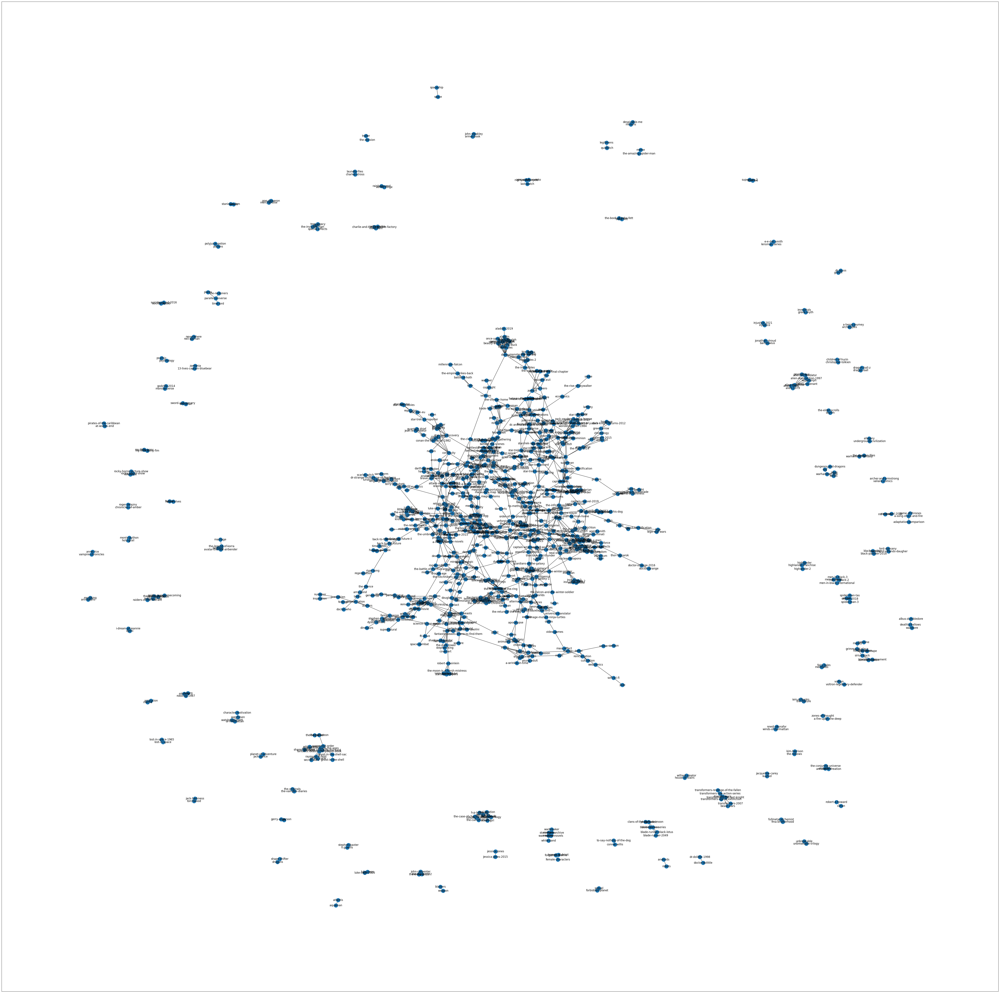

In [87]:
import matplotlib.pyplot as plt

plt.figure(figsize=(80, 80))
nx.draw_networkx(G)

In [88]:
nx.get_edge_attributes(G, 'weight')

{('sauron', 'the-silmarillion'): 2,
 ('sauron', 'morgoth'): 1,
 ('sauron', 'prophecy'): 1,
 ('sauron', 'hobbits'): 1,
 ('sauron', 'the-battle-of-the-five-armies'): 2,
 ('title-explanation', 'spider-man-homecoming'): 4,
 ('title-explanation', 'the-last-crusade'): 5,
 ('title-explanation', 'indiana-jones'): 4,
 ('vernor-vinge', 'rainbows-end'): 5,
 ('phaser', 'star-trek-discovery'): 3,
 ('john-carpenter', 'the-thing-1982'): 5,
 ('john-carpenter', 'the-thing-2011'): 4,
 ('music-video', 'actor-identification'): 4,
 ('music-video', 'actors'): 3,
 ('music-video', 'take-on-me'): 5,
 ('dracula', 'nuclear-weapons'): 4,
 ('dracula', 'dracula-untold'): 5,
 ('larry-niven', 'prediction'): 4,
 ('larry-niven', 'known-space'): 5,
 ('larry-niven', 'ringworld'): 5,
 ('h.g.wells', 'stephen-baxter'): 5,
 ('wax-wayne-novels', 'cosmere'): 4,
 ('wax-wayne-novels', 'mistborn'): 5,
 ('universal-translator', 'languages'): 3,
 ('the-empire-strikes-back', 'battle-of-hoth'): 2,
 ('the-empire-strikes-back', 'millen

In [91]:
weights = list(nx.get_edge_attributes(G, 'weight').values())
plt.figure(figsize=(100, 100))
nx.draw_networkx(G, width=weights)

# 2 с половиной (не важно)

In [92]:
tags_dependence.idxmax()

0
sauron                tolkiens-legendarium
space-opera           story-identification
vernor-vinge                  rainbows-end
ravenclaw                     harry-potter
wax-wayne-novels                   cosmere
                              ...         
looper                              sauron
the-animatrix                   the-matrix
planet-of-the-apes                  sauron
snowpiercer                         sauron
praxis                             klingon
Length: 1263, dtype: object

In [93]:
tags_dependence.max()

0
sauron                13
space-opera            1
vernor-vinge           1
ravenclaw              1
wax-wayne-novels       2
                      ..
looper                 0
the-animatrix          6
planet-of-the-apes     0
snowpiercer            0
praxis                 1
Length: 1263, dtype: int64

In [ ]:
set_tags = pd.DataFrame(set_tags)
for i in range (500):
    if (i % 100 == 0):
        print(i)
    row = set_tags[0][i]
    for j in range (500):
        col = set_tags[0][j]

        if (tags_dependence[col][row] != 0):
            tags_dependence[col][row] = tags_dependence[col][row] / df_list_tags['count'][row] * 100

#tags_dependence

In [95]:
tags_dependence

,sauron,space-opera,vernor-vinge,ravenclaw,wax-wayne-novels,astronauts,universal-translator,thomas-covenant,dragon-ball,dragon-ball-z,...,immortals,wizards,ms-marvel,sergei-lukyanenko,starfleet-command,looper,the-animatrix,planet-of-the-apes,snowpiercer,praxis
0,,,,,,,,,,,,,,,,,,,,,
sauron,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
space-opera,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
vernor-vinge,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
ravenclaw,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
wax-wayne-novels,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
looper,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
the-animatrix,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0
planet-of-the-apes,0.0,0.0,0,0,0.0,0.0,0,0.0,0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [96]:
tags_dependence.sum(axis=1)

0
sauron                126.692308
space-opera           201.000000
vernor-vinge            1.000000
ravenclaw               1.000000
wax-wayne-novels      102.000000
                         ...    
looper                  0.000000
the-animatrix           8.000000
planet-of-the-apes      0.000000
snowpiercer             0.000000
praxis                  2.000000
Length: 1263, dtype: float64

In [97]:
tags_dependence.idxmax(axis=1)

0
sauron                the-lord-of-the-rings
space-opera            story-identification
vernor-vinge                   rainbows-end
ravenclaw                      harry-potter
wax-wayne-novels                    cosmere
                              ...          
looper                               sauron
the-animatrix                    the-matrix
planet-of-the-apes                   sauron
snowpiercer                          sauron
praxis                              klingon
Length: 1263, dtype: object

In [98]:
tags_dependence.max(axis=1)

0
sauron                 76.923077
space-opera           100.000000
vernor-vinge            1.000000
ravenclaw               1.000000
wax-wayne-novels      100.000000
                         ...    
looper                  0.000000
the-animatrix           6.000000
planet-of-the-apes      0.000000
snowpiercer             0.000000
praxis                  1.000000
Length: 1263, dtype: float64

In [99]:
sim_tags = pd.DataFrame()
sim_tags['tag'] = list(tags_dependence.index)
sim_tags['freq'] = sim_tags['tag'].apply(lambda x: df_list_tags['count'][x])
sim_tags['sim_tag'] = list(tags_dependence.idxmax(axis=1))
sim_tags['similarity'] = list(tags_dependence.max(axis=1))
sim_tags

,tag,freq,sim_tag,similarity
0,sauron,13,the-lord-of-the-rings,76.923077
1,space-opera,1,story-identification,100.000000
2,vernor-vinge,1,rainbows-end,1.000000
3,ravenclaw,1,harry-potter,1.000000
4,wax-wayne-novels,2,cosmere,100.000000
...,...,...,...,...
1258,looper,1,sauron,0.000000
1259,the-animatrix,6,the-matrix,6.000000
1260,planet-of-the-apes,2,sauron,0.000000
1261,snowpiercer,1,sauron,0.000000


In [100]:
sim_tags[sim_tags['tag'] == 'world-war-two']

,tag,freq,sim_tag,similarity


In [ ]:
sim_tags[sim_tags['tag'] == 'nazi-germany']

,tag,freq,sim_tag,similarity
210,nazi-germany,693,world-war-two,67.965368


In [101]:
sim_tags[sim_tags['similarity'] >= 75]

,tag,freq,sim_tag,similarity
0,sauron,13,the-lord-of-the-rings,76.923077
1,space-opera,1,story-identification,100.000000
4,wax-wayne-novels,2,cosmere,100.000000
5,astronauts,1,story-identification,100.000000
7,thomas-covenant,2,books,100.000000
...,...,...,...,...
1025,harry-potter,837,voldemort,94.000000
1053,star-trek,472,star-trek-tng,153.000000
1133,novel,146,story-identification,142.000000
1143,the-force-awakens,82,star-wars,82.000000


In [ ]:
sim_tags[sim_tags['sim_tag'] == 'world-war-two'].sort_values(by=['similarity'])

,tag,freq,sim_tag,similarity
184,world,41,world-war-two,14.634146
365,war,587,world-war-two,15.161840
412,united-states,1612,world-war-two,15.260546
317,italy,103,world-war-two,15.533981
7,australia,50,world-war-two,16.000000
368,britain,173,world-war-two,16.763006
147,statistics,23,world-war-two,17.391304
409,resource,34,world-war-two,17.647059
403,military,995,world-war-two,17.788945
338,diplomacy,95,world-war-two,17.894737


In [102]:
tag_dep = tags_dependence.copy()
for i in range (500):
    row = sim_tags['tag'][i]
    col = sim_tags['sim_tag'][i]
    tag_dep[col][row] = -1

<ipython-input-102-a0ecbeca5052>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tag_dep[col][row] = -1
<ipython-input-102-a0ecbeca5052>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tag_dep[col][row] = -1
<ipython-input-102-a0ecbeca5052>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tag_dep[col][row] = -1
<ipython-input-102-a0ecbeca5052>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

In [103]:
tag_dep.max(axis=1)

0
sauron                 13.0
space-opera           100.0
vernor-vinge            0.0
ravenclaw               0.0
wax-wayne-novels        2.0
                      ...  
looper                  0.0
the-animatrix           6.0
planet-of-the-apes      0.0
snowpiercer             0.0
praxis                  1.0
Length: 1263, dtype: float64

In [104]:
tag_dep.idxmax(axis=1)

0
sauron                tolkiens-legendarium
space-opera                          books
vernor-vinge                        sauron
ravenclaw                           sauron
wax-wayne-novels                  mistborn
                              ...         
looper                              sauron
the-animatrix                   the-matrix
planet-of-the-apes                  sauron
snowpiercer                         sauron
praxis                             klingon
Length: 1263, dtype: object

In [105]:
sim_tags['sec_sim_tag'] = list(tag_dep.idxmax(axis=1))
sim_tags['sec_similarity'] = list(tag_dep.max(axis=1))
sim_tags['sum_similarity'] = sim_tags['similarity'] + sim_tags['sec_similarity']
sim_tags

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
0,sauron,13,the-lord-of-the-rings,76.923077,tolkiens-legendarium,13.0,89.923077
1,space-opera,1,story-identification,100.000000,books,100.0,200.000000
2,vernor-vinge,1,rainbows-end,1.000000,sauron,0.0,1.000000
3,ravenclaw,1,harry-potter,1.000000,sauron,0.0,1.000000
4,wax-wayne-novels,2,cosmere,100.000000,mistborn,2.0,102.000000
...,...,...,...,...,...,...,...
1258,looper,1,sauron,0.000000,sauron,0.0,0.000000
1259,the-animatrix,6,the-matrix,6.000000,the-matrix,6.0,12.000000
1260,planet-of-the-apes,2,sauron,0.000000,sauron,0.0,0.000000
1261,snowpiercer,1,sauron,0.000000,sauron,0.0,0.000000


In [108]:
sim_tags = sim_tags[sim_tags['similarity'] >= 75]
sim_tags = sim_tags[sim_tags['freq'] > 20]
sim_tags

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
18,science-fiction-genre,25,history-of,80.000000,movie,8.000000,88.000000
41,gandalf,24,the-lord-of-the-rings,95.833333,tolkiens-legendarium,24.000000,119.833333
43,game-of-thrones,139,a-song-of-ice-and-fire,75.000000,adaptation-comparison,7.000000,82.000000
49,young-adult,46,story-identification,95.652174,books,39.130435,134.782609
70,the-phantom-menace,22,star-wars,100.000000,revenge-of-the-sith,13.636364,113.636364
123,lightsaber,25,star-wars,100.000000,kylo-ren,8.000000,108.000000
134,tv,76,story-identification,76.315789,movie,11.842105,88.157895
151,marvel-cinematic-universe,276,marvel,100.000000,thor-marvel,22.000000,122.000000
154,avengers-endgame,38,marvel-cinematic-universe,100.000000,marvel,100.000000,200.000000
167,darth-sidious,27,star-wars,100.000000,sith,25.925926,125.925926


In [107]:
ST = sim_tags[sim_tags['similarity'] >= 75]
ST[ST['sec_similarity'] >= 50]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
1,space-opera,1,story-identification,100.0,books,100.0,200.0
5,astronauts,1,story-identification,100.0,time-travel,100.0,200.0
14,saruman,4,the-lord-of-the-rings,100.0,gandalf,50.0,150.0
21,plants,1,magic,100.0,manga,100.0,200.0
23,thor-the-dark-world,14,marvel-cinematic-universe,100.0,marvel,100.0,200.0
...,...,...,...,...,...,...,...
1025,harry-potter,837,voldemort,94.0,voldemort,94.0,188.0
1053,star-trek,472,star-trek-tng,153.0,star-trek-tng,153.0,306.0
1133,novel,146,story-identification,142.0,story-identification,142.0,284.0
1143,the-force-awakens,82,star-wars,82.0,star-wars,82.0,164.0


In [ ]:
ST = sim_tags[sim_tags['similarity'] <= 75]
ST[ST['sec_similarity'] >= 50]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
26,organised-crime,12,crime,58.333333,united-states,50.000000,108.333333
28,political-party,50,political-history,74.000000,united-states,62.000000,136.000000
94,holocaust,109,world-war-two,54.128440,nazi-germany,52.293578,106.422018
132,industry,11,world-war-two,72.727273,soviet-union,54.545455,127.272727
190,confederacy,32,american-civil-war,62.500000,united-states,59.375000,121.875000
359,uniform,122,identification,54.918033,military,50.819672,105.737705
371,great-depression,28,united-states,57.142857,economy,53.571429,110.714286
384,finland,31,soviet-union,54.838710,world-war-two,51.612903,106.451613
449,scramble-for-africa,12,africa,58.333333,colonization,50.000000,108.333333
460,assyrian-empire,14,ancient-babylon,50.000000,ancient-history,50.000000,100.000000


In [ ]:
sim_tags[sim_tags['sum_similarity'] >= 100]

,tag,freq,sim_tag,similarity,sec_sim_tag,sec_similarity,sum_similarity
0,,704,,100.000000,caribbean,0.000000,100.000000
6,washington-state,13,united-states,92.307692,contemporary-history,46.153846,138.461538
9,spanish-civil-war,19,fascism,52.631579,spain,47.368421,100.000000
11,tudor-period,18,england,66.666667,henry-viii,38.888889,105.555556
12,alexander-the-great,36,ancient-greece,55.555556,ancient-history,47.222222,102.777778
13,atlantic-slave-trade,20,slavery,90.000000,africa,40.000000,130.000000
17,macedon,19,ancient-greece,68.421053,alexander-the-great,42.105263,110.526316
24,cryptology,18,world-war-two,88.888889,espionage,22.222222,111.111111
25,sparta,18,ancient-greece,94.444444,greco-persian-wars,22.222222,116.666667
26,organised-crime,12,crime,58.333333,united-states,50.000000,108.333333


# 3. Make final data

In [ ]:
good_tags = list(tags_dependence.index)
len(good_tags)

500

In [ ]:
minor_tags = list(sim_tags[sim_tags['similarity'] >= 75].tag)
len(minor_tags)

33

In [ ]:
major_tags = list(sim_tags[sim_tags['similarity'] >= 75].sim_tag)
len(major_tags)

33

In [ ]:
def clean_tag(tag):
    tag = tag.replace("'", '')
    tag = tag.replace('[', '')
    tag = tag.replace(']', '')
    tag = tag.replace(',', '')
    tags = re.split(" ", tag)

    upd_tags = []
    for t in tags:
        if (t in good_tags):
            if (t in minor_tags):
                idx = minor_tags.index(t)
                major_t = major_tags[idx]
                upd_tags.append(major_t)
            else:
                upd_tags.append(t)

    return list(set(upd_tags))

## 3.1. Данные по вопросам

In [ ]:
answer_data_clean

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"['united-states', 'election']",True,"From my earliest memory, I've always thought t...",user541852587,255,12
1,1,https://history.stackexchange.com/questions/27...,1,"['united-states', 'election']",False,"Yes. As a matter of fact, 1980 was a pivotal e...",D J Sims,1,11
2,1,https://history.stackexchange.com/questions/27...,2,"['united-states', 'election']",False,The currently accepted answer is a good one*. ...,T.E.D.,119000,14
3,1,https://history.stackexchange.com/questions/27...,3,"['united-states', 'election']",False,"In 1860, the (Republican) ""Party of Lincoln"" w...",Tom Au,105000,2
4,2,https://history.stackexchange.com/questions/91...,0,"['military', 'japan', 'naval', 'russia']",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
...,...,...,...,...,...,...,...,...,...
58091,15347,https://history.stackexchange.com/questions/58...,0,"['20th-century', 'europe', 'world-war-one']",True,Closed. This question is opinion-based. It is ...,Person,497,14
58092,15347,https://history.stackexchange.com/questions/58...,1,"['20th-century', 'europe', 'world-war-one']",False,"It is really, really hard to assign guilt or b...",NotVonKaiser,2877,22
58093,15347,https://history.stackexchange.com/questions/58...,2,"['20th-century', 'europe', 'world-war-one']",False,"I understand that writing ""any historians"" you...",Voitcus,7161,4
58094,15347,https://history.stackexchange.com/questions/58...,3,"['20th-century', 'europe', 'world-war-one']",False,"The answer, of course, is that no single count...",two sheds,183000,1


In [ ]:
data_final = answer_data_clean.copy()
data_final['tags'] = answer_data['tags'].apply(lambda x: clean_tag(x))
data_final

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"[election, united-states]",True,"From my earliest memory, I've always thought t...",user541852587,255,12
1,1,https://history.stackexchange.com/questions/27...,1,"[election, united-states]",False,"Yes. As a matter of fact, 1980 was a pivotal e...",D J Sims,1,11
2,1,https://history.stackexchange.com/questions/27...,2,"[election, united-states]",False,The currently accepted answer is a good one*. ...,T.E.D.,119000,14
3,1,https://history.stackexchange.com/questions/27...,3,"[election, united-states]",False,"In 1860, the (Republican) ""Party of Lincoln"" w...",Tom Au,105000,2
4,2,https://history.stackexchange.com/questions/91...,0,"[military, naval, japan, russia]",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
...,...,...,...,...,...,...,...,...,...
58091,15347,https://history.stackexchange.com/questions/58...,0,"[historiography, theoretical-history, philosophy]",True,Closed. This question is opinion-based. It is ...,Person,497,14
58092,15347,https://history.stackexchange.com/questions/58...,1,"[historiography, theoretical-history, philosophy]",False,"It is really, really hard to assign guilt or b...",NotVonKaiser,2877,22
58093,15347,https://history.stackexchange.com/questions/58...,2,"[historiography, theoretical-history, philosophy]",False,"I understand that writing ""any historians"" you...",Voitcus,7161,4
58094,15347,https://history.stackexchange.com/questions/58...,3,"[historiography, theoretical-history, philosophy]",False,"The answer, of course, is that no single count...",two sheds,183000,1


In [ ]:
questions_final = data_final[data_final['is_question'] == True]
questions_final

,user_num,link,num_answer,tags,is_question,answer_text,author_name,reputation,likes
0,1,https://history.stackexchange.com/questions/27...,0,"[election, united-states]",True,"From my earliest memory, I've always thought t...",user541852587,255,12
4,2,https://history.stackexchange.com/questions/91...,0,"[military, naval, japan, russia]",True,"In 1905, during the Russo-Japanese War, a Russ...",Tom Au,105000,23
7,3,https://history.stackexchange.com/questions/10...,0,"[france, monarchy, quotes]",True,I am not well enough read in French history an...,MCW,336000,21
12,4,https://history.stackexchange.com/questions/30...,0,"[language, england]",True,Very difficult to write a good answer; the sou...,MCW,336000,1
13,5,https://history.stackexchange.com/questions/29...,0,"[world, world-war-two]",True,"After the second world war, what happened to a...",Marcus Hellström,29,2
...,...,...,...,...,...,...,...,...,...
58069,15343,https://history.stackexchange.com/questions/12...,0,"[ancient-rome, middle-ages, ancient-history, s...",True,I've read somewhere that the ratio of Soviet t...,RobertLee,862,25
58084,15344,https://history.stackexchange.com/questions/61...,0,"[canada, united-states]",True,"While researching the answer to ""How was Germa...",Martin Sojka,1239,25
58086,15345,https://history.stackexchange.com/questions/37...,0,"[historiography, theoretical-history, philosophy]",True,"Anecdotally, it seems as though species of fau...",Mike Scott,318,14
58089,15346,https://history.stackexchange.com/questions/42...,0,"[historiography, theoretical-history, philosophy]",True,Is it true that the Incas thought that the Spa...,Hiwa K,9,-1


In [ ]:
tags = questions_final['tags']
list_tags = []
for tag in tags:
  for t in tag:
    list_tags.append(t)
len(list_tags)

39935

In [ ]:
set_tags = set(list_tags)
len(set_tags)

468

In [ ]:
df_list_tags = pd.DataFrame(list_tags)
df_list_tags[0].value_counts()

0
world-war-two     2143
united-states     1508
military          1141
middle-ages        906
nazi-germany       796
                  ... 
computers            6
late-antiquity       6
london               6
aviation             6
paris                4
Name: count, Length: 468, dtype: int64

## 3.2. Данные по пользователям

In [ ]:
user_tags = pd.read_csv('user_tags.csv', names=['user_num', 'link', 'user_name', 'tag', 'reputation', 'num_answers'], header=None)
user_tags

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,united-states,2403,196
1,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,world-war-two,891,68
2,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,political-history,659,52
3,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,middle-ages,588,45
4,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,ancient-history,577,61
...,...,...,...,...,...,...
16890,3459,https://history.stackexchange.com/users/29006/jmw,jmw,japan,8,2
16891,3459,https://history.stackexchange.com/users/29006/jmw,jmw,ww2-pacific-theater,6,1
16892,3459,https://history.stackexchange.com/users/29006/jmw,jmw,international-relations,3,1
16893,3459,https://history.stackexchange.com/users/29006/jmw,jmw,peace-treaty,3,1


In [ ]:
relevant_tags = list(set(good_tags) - set(minor_tags))
len(relevant_tags)

467

In [ ]:
user_tags_final = user_tags[np.isin(user_tags, relevant_tags).any(axis=1)]
user_tags_final

,user_num,link,user_name,tag,reputation,num_answers
0,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,united-states,2403,196
1,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,world-war-two,891,68
2,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,political-history,659,52
3,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,middle-ages,588,45
4,1,https://history.stackexchange.com/users/771/t-e-d,t-e-d,ancient-history,577,61
...,...,...,...,...,...,...
16888,3448,https://history.stackexchange.com/users/37835/...,msouth,engineering,5,1
16889,3459,https://history.stackexchange.com/users/29006/jmw,jmw,world-war-two,12,5
16890,3459,https://history.stackexchange.com/users/29006/jmw,jmw,japan,8,2
16892,3459,https://history.stackexchange.com/users/29006/jmw,jmw,international-relations,3,1


In [ ]:
user_tags_final['tag'].value_counts()

tag
world-war-two          187
united-states          178
military               165
20th-century           161
middle-ages            156
                      ... 
scramble-for-africa      6
late-antiquity           4
methodology              4
mussolini                4
electoral-college        2
Name: count, Length: 467, dtype: int64